In [1]:
# add path to ssa package
import sys
sys.path.append('../../..')

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import pathlib
import cvxpy as cv

import pickle
from time import time
import re

%matplotlib inline 

In [3]:
# tssa model
from src.ssa_methods.t_ssa import t_SSA

# plot with large fonts and other stuff
from src.plot.journal_style import EnableJournalStylePlotting

# data extraction methods
from src.data.accelerometer_1 import GetWalkData

# partition finding algorithms
from src.ssa_methods.ssa_complementary.ssa_multidim_partition import NextDichotomyPartition

## Data preprocessing

In [4]:
# names of observed signals
sig_names = ['$a_x$', '$a_y$', '$a_z$', '$w_x$', '$w_y$', '$w_z$']
# measure units
# acceleration is in g-units (g=9.8)
sig_units = ["m/$s^2$", "m/$s^2$", "m/$s^2$", "rad/s", "rad/s", "rad/s"]

num_signals = 6

In [5]:
# retrive signals and corresponding time grids
# this is walking motion
# first 3 components = accelerometer, last 3 - gyroscope
(train_data, time_grid_train), (test_data, time_grid_test) = GetWalkData()

print("Train len = ", train_data.shape[0])
print("Test len = ", test_data.shape[0])

Train len =  1375
Test len =  302


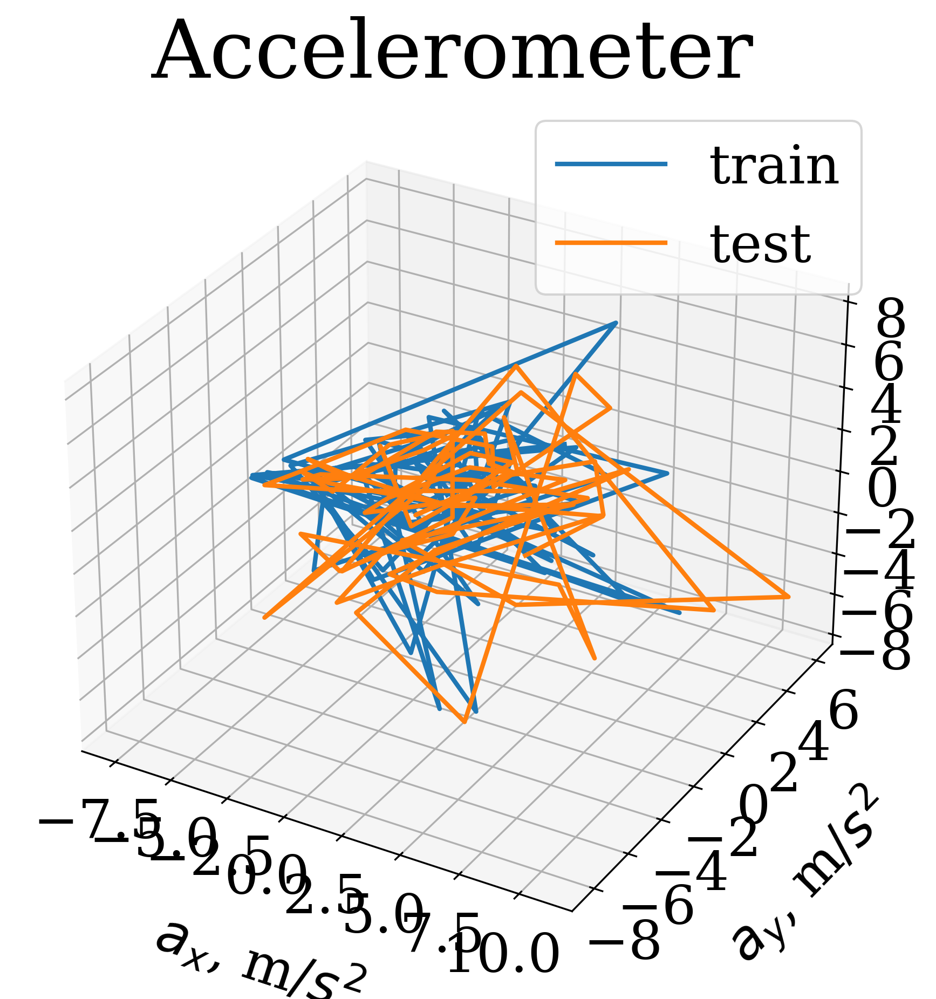

In [6]:
# draw accelerometer signals
with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')
    
    train_points = train_data.T[:3, ::20]
    test_points = test_data.T[:3, ::4]
    
    ax.plot(*train_points, label="train")
    ax.plot(*test_points, label="test")
    
    ax.set_xlabel(f"{sig_names[0]}, {sig_units[0]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[1]}, {sig_units[1]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[2]}, {sig_units[2]}", labelpad=21)
    ax.set_title("Accelerometer")
    ax.legend()

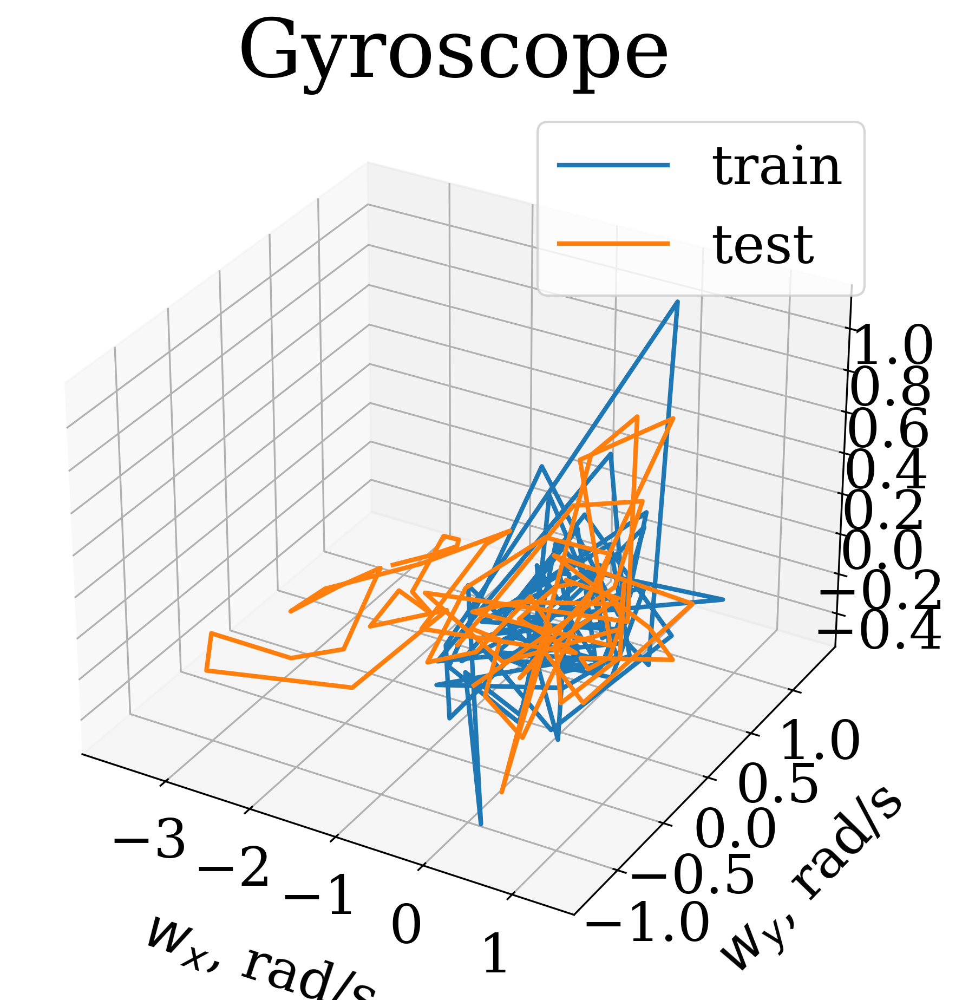

In [7]:
# draw gyro signals
with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')

    train_points = train_data.T[3:, ::20]
    test_points = test_data.T[3:, ::4]

    ax.plot(*train_points, label="train")
    ax.plot(*test_points, label="test")

    ax.set_xlabel(f"{sig_names[3]}, {sig_units[3]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[4]}, {sig_units[4]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[5]}, {sig_units[5]}", labelpad=21)
    ax.set_title("Gyroscope")
    ax.legend()

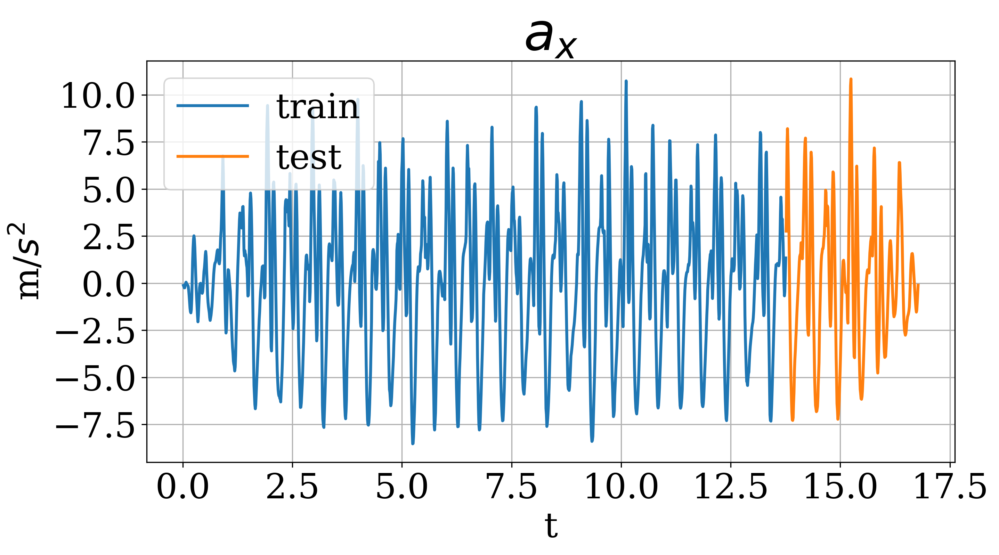

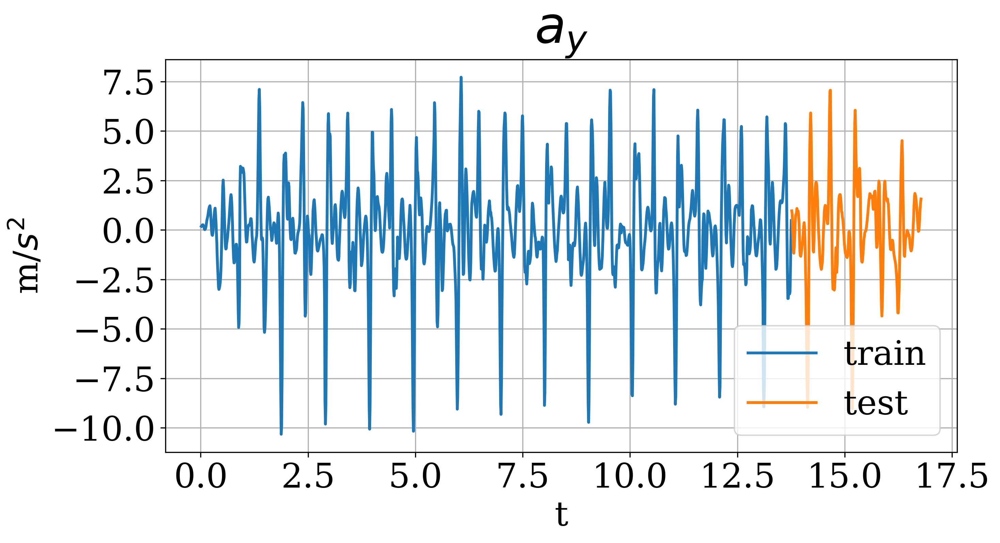

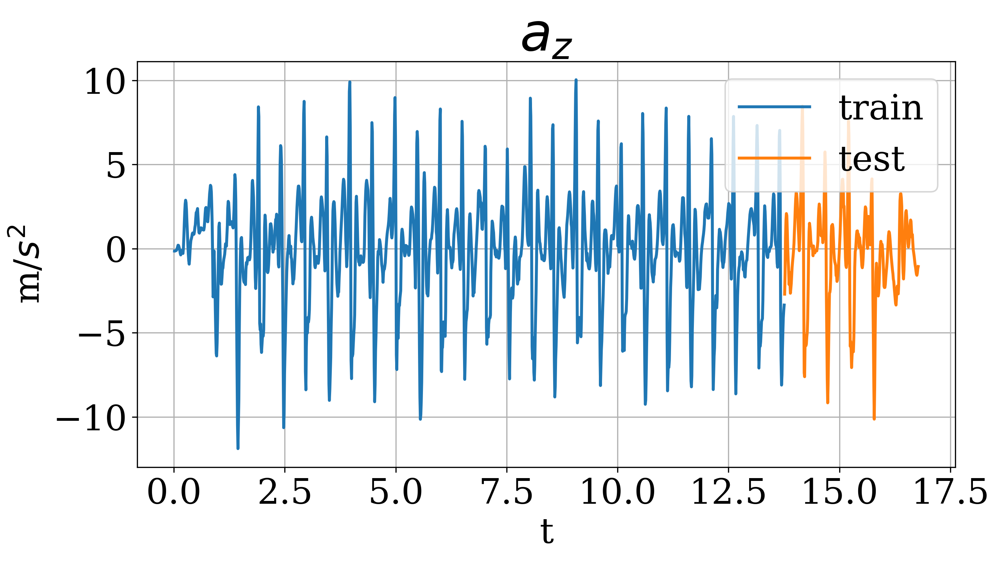

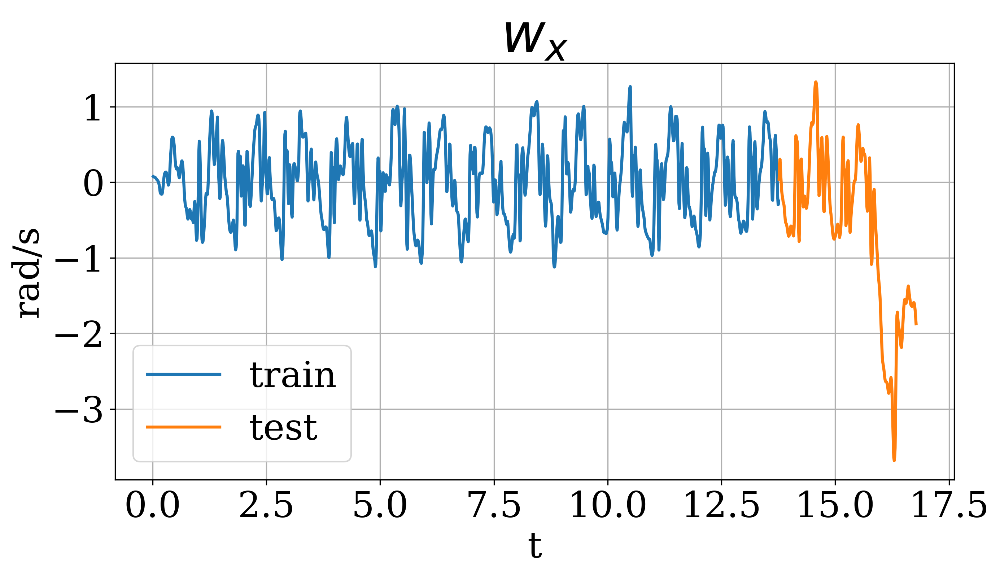

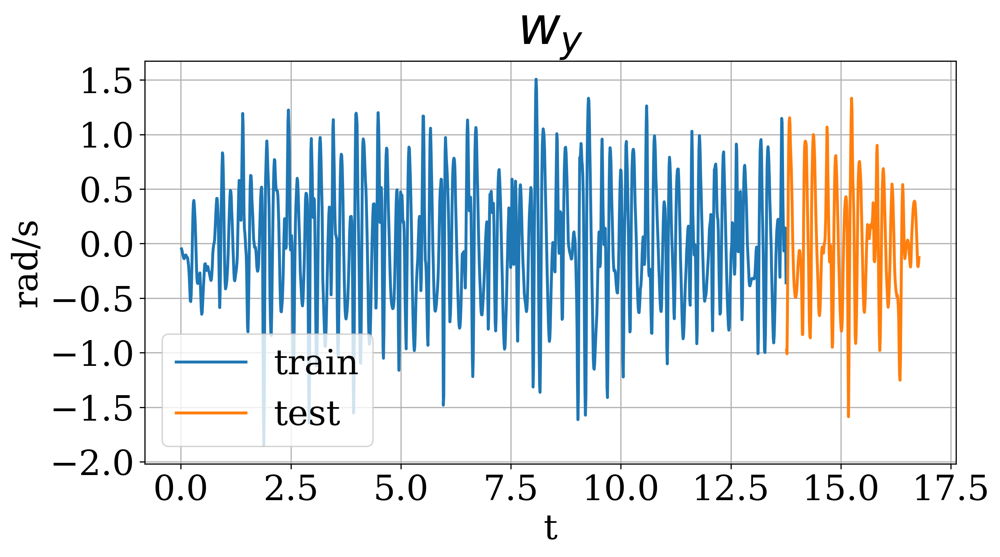

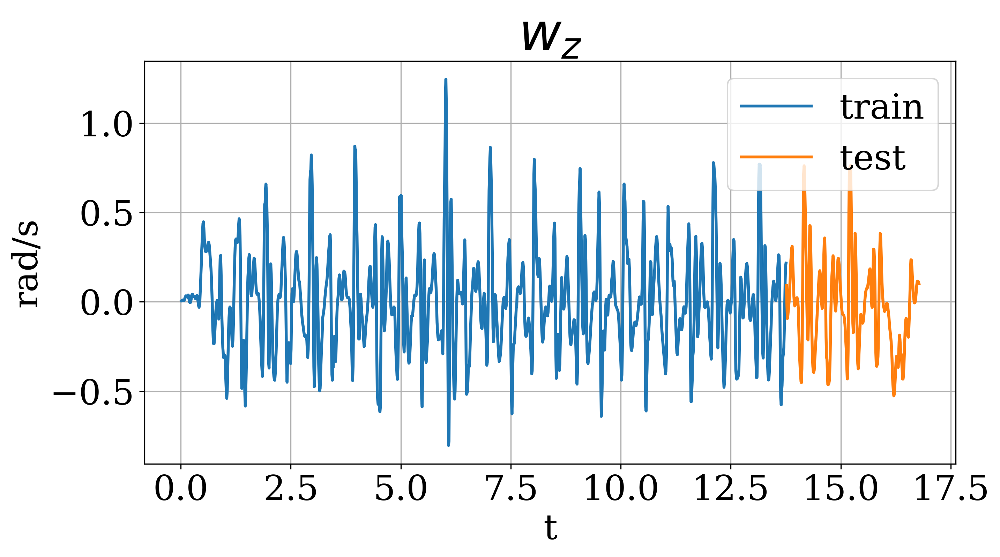

In [8]:
# draw signals
for i in range(num_signals):
    with EnableJournalStylePlotting():
        fig, ax = plt.subplots(figsize=(10, 5))

        ax.plot(time_grid_train, train_data.T[i], label='train')
        ax.plot(time_grid_test, test_data.T[i], label='test')

        ax.grid(True)
        ax.legend()
        ax.set_xlabel('t')
        ax.set_ylabel(sig_units[i])
        ax.set_title(sig_names[i])

## Global method parameters

In [9]:
# aka L parameter
ssa_window_size = 1000

cpd_ranks = np.arange(5, 40 + 1, 5)
forecast_results = {key: {"mse": None, "mape": None} for key in cpd_ranks}

# parameter for detereministic behaviour of tSSA
random_state = 42

In [10]:
# colours for our signals (https://colorhunt.co/palette/808836ffbf00ff9a00d10363)
color_list = ['#808836', '#FFBF00', '#FF9A00', "#D10363", "#6C0345", "#DC6B19", "#01204E"]

## tSSA fitting

In [11]:
# make directory for models
pathlib.Path(f'./saved_model').mkdir(parents=True, exist_ok=True)

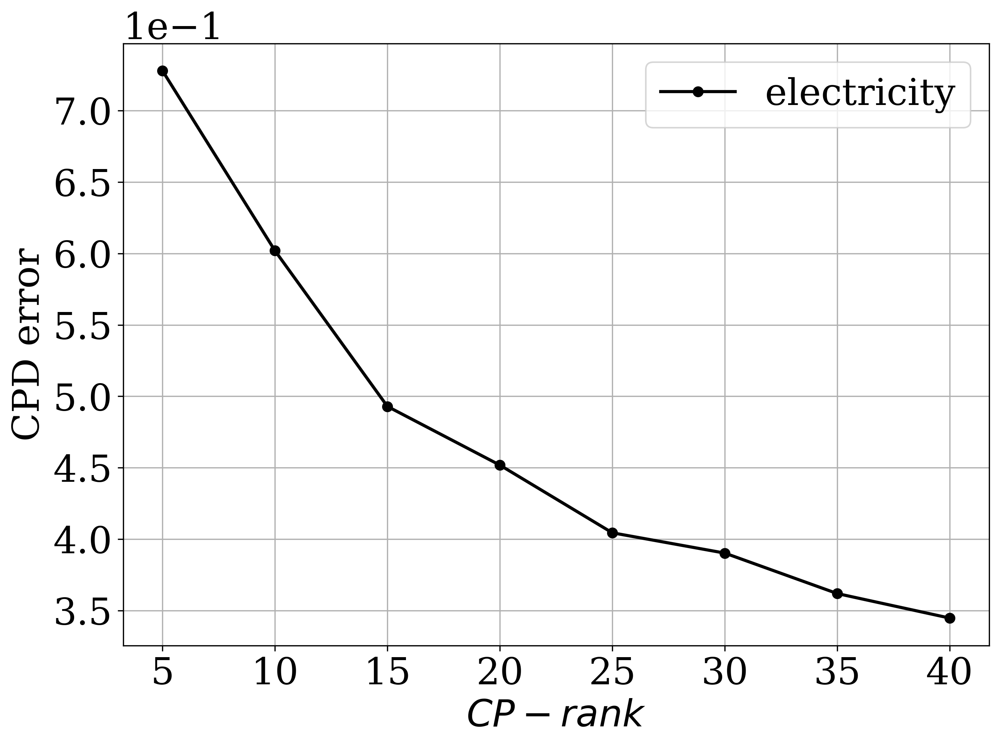

In [12]:
cpd_errors = []

for cpd_rank in cpd_ranks:
    with open(f'./saved_model/cpd_rank_{cpd_rank}.pkl', 'rb') as f:
        t_ssa_obj: t_SSA = pickle.load(f)
    
    cpd_errors.append(t_ssa_obj.cpd_err_rel)

with EnableJournalStylePlotting():
    fig, ax = plt.subplots(figsize=(10, 7))

    ax.plot(cpd_ranks, cpd_errors, marker=".", color="black", label="electricity")
    
    ax.legend()
    ax.grid(True)
    ax.set_ylabel(r"CPD error")
    ax.set_xlabel('$CP-rank$')

    ax.set_xticks(cpd_ranks)
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    fig.savefig(f'./figs/CPD_error.png', format='png')

In [13]:
for cpd_rank in cpd_ranks:
    print(f"CP rank = {cpd_rank}")

    t_ssa_obj = t_SSA(ssa_window_size, train_data.T, cpd_rank)

    # make svd for common matrix, extract factors and singular values
    t_ssa_obj.decompose_tt(random_state=random_state)
    print(f"CPD-error = {t_ssa_obj.cpd_err_rel}")

    # save model
    with open(f'./saved_model/cpd_rank_{cpd_rank}.pkl', 'wb') as f:
        pickle.dump(t_ssa_obj, f)

    t_ssa_obj.remove_last_predictions()

    # get prediction for cuurent number of factors left
    forecast_tssa = np.empty(test_data.shape)
    
    for i in range(test_data.shape[0]):
        forecast_tssa[i] = np.array(t_ssa_obj.predict_next())
    
    # get MSE for every signal
    signals_mse_tssa = np.mean((forecast_tssa - test_data) ** 2, axis=0)
    # get MAPE for every signal
    signals_mape_tssa = np.mean(np.abs((forecast_tssa - test_data) / test_data), axis=0)

    forecast_results[cpd_rank]["mse"] = signals_mse_tssa
    forecast_results[cpd_rank]["mape"] = signals_mape_tssa
    
    print(f'MSE: {signals_mse_tssa}; Mean by signals = {np.mean(signals_mse_tssa):e}')
    print(f'MAPE: {signals_mape_tssa}; Mean by signals = {np.mean(signals_mape_tssa):e}')

CP rank = 5
CPD-error = 0.7279522389968665
MSE: [9.92746438 5.46973984 5.72947062 1.56463205 0.27693487 0.06674738]; Mean by signals = 3.839165e+00
MAPE: [2.87790435 1.57608015 7.08733309 7.77952524 4.53820175 1.67981455]; Mean by signals = 4.256477e+00
CP rank = 10
CPD-error = 0.6019706984604098
MSE: [10.40961748  4.52521907  6.87282472  1.52551861  0.29417512  0.06379473]; Mean by signals = 3.948525e+00
MAPE: [ 2.17918366  3.56645153  5.59286121 11.44635856  4.39471921  8.57567345]; Mean by signals = 5.959208e+00
CP rank = 15
CPD-error = 0.4929106600343133
MSE: [10.25607094  5.56113311  7.20242794  1.50612943  0.28431158  0.07166372]; Mean by signals = 4.146956e+00
MAPE: [2.2466331  3.27005517 5.25237622 3.44989356 4.17760577 4.94960863]; Mean by signals = 3.891029e+00
CP rank = 20
CPD-error = 0.45182305627855107
MSE: [9.61501685 5.59161646 6.84631919 1.49282961 0.26774761 0.0719214 ]; Mean by signals = 3.980909e+00
MAPE: [2.09655173 3.28770617 5.29138895 3.08815713 3.83582653 4.3946

In [14]:
with open(f"./saved_model/forecast_results", "wb") as f:
    pickle.dump(forecast_results, f)

In [ ]:
with open(f"./saved_model/forecast_results", "rb") as f:
    forecast_results:dict = pickle.load(f)

In [19]:
print("Accel")
print("MSE", np.mean(forecast_results[20]['mse'][:3]))
print("MAPE", np.mean(forecast_results[20]['mape'][:3]))

print("Gyro")
print("MSE", np.mean(forecast_results[20]['mse'][3:]))
print("MAPE", np.mean(forecast_results[20]['mape'][3:]))

print("Overall")
print("MSE", np.mean(forecast_results[20]['mse']))
print("MAPE", np.mean(forecast_results[20]['mape']))

Accel
MSE 7.350984166861686
MAPE 3.5585489488786095
Gyro
MSE 0.6108328730632842
MAPE 3.772869869630609
Overall
MSE 3.980908519962485
MAPE 3.665709409254609


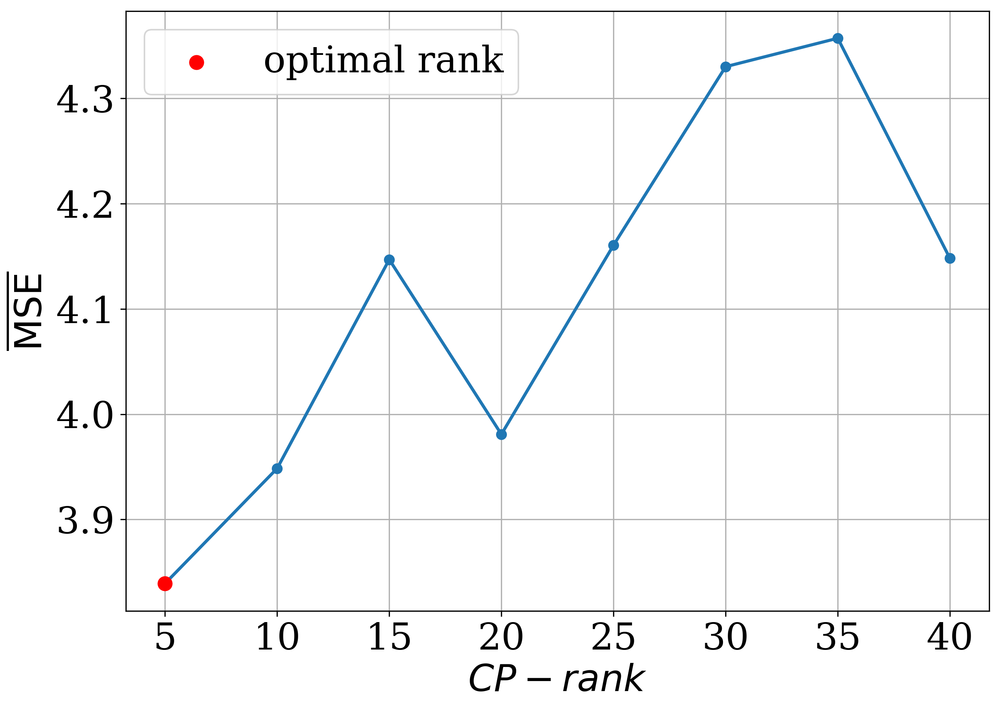

In [17]:
# plot mean MSE
with EnableJournalStylePlotting():
    fig, ax = plt.subplots(figsize=(10, 7))

    mean_mses = []
    for key, item in forecast_results.items():
        mean_mses.append(item["mse"].mean())

    ax.plot(forecast_results.keys(), mean_mses, marker=".")
    ax.scatter([5], [mean_mses[0]], marker=".", s=300, c="red", label="optimal rank", zorder=10)
    
    ax.legend()
    ax.grid(True)
    ax.set_ylabel(r"$ \overline{\text{MSE}} $")
    ax.set_xlabel('$CP-rank$')

    ax.set_xticks(list(forecast_results.keys()))
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    pathlib.Path("./figs/prediction").mkdir(exist_ok=True, parents=True)
    fig.savefig(f'./figs/prediction/MSE_rank.png',
                         format='png')

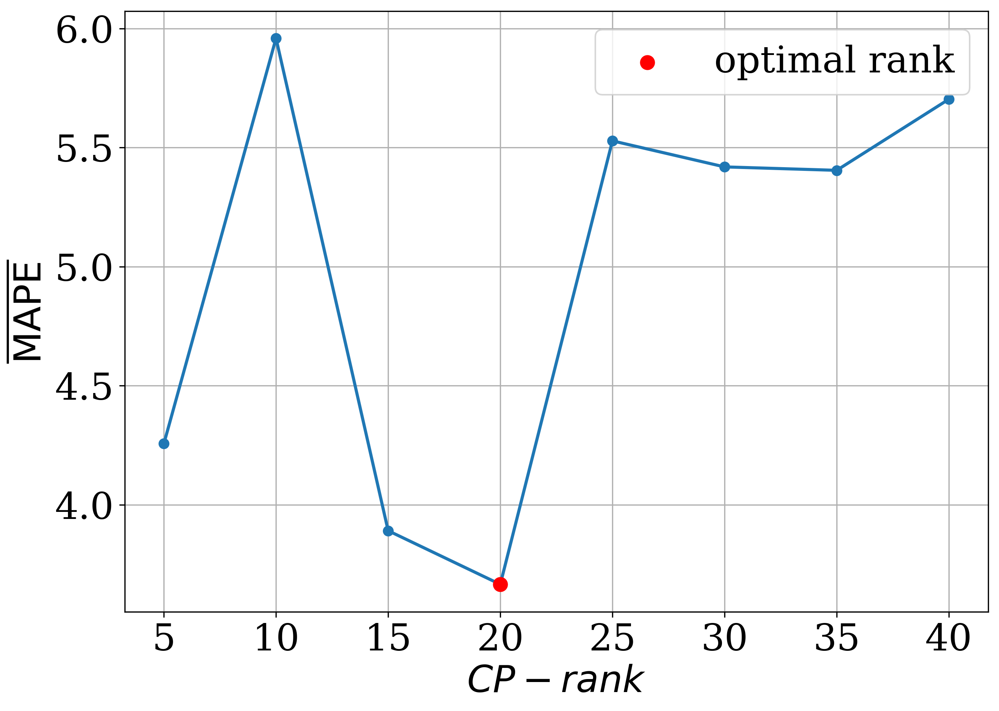

In [18]:
# plot mean MAPE
with EnableJournalStylePlotting():
    fig, ax = plt.subplots(figsize=(10, 7))

    mean_mapes = []
    for key, item in forecast_results.items():
        mean_mapes.append(item["mape"].mean())

    ax.plot(forecast_results.keys(), mean_mapes, marker=".")
    ax.scatter([20], [mean_mapes[3]], marker=".", s=300, c="red", label="optimal rank", zorder=10)

    ax.legend()
    ax.grid(True)
    ax.set_ylabel(r"$ \overline{\text{MAPE}} $")
    ax.set_xlabel('$CP-rank$')

    ax.set_xticks(list(forecast_results.keys()))
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    fig.savefig(f'./figs/prediction/MAPE_rank.png',
                         format='png')

## Prediction

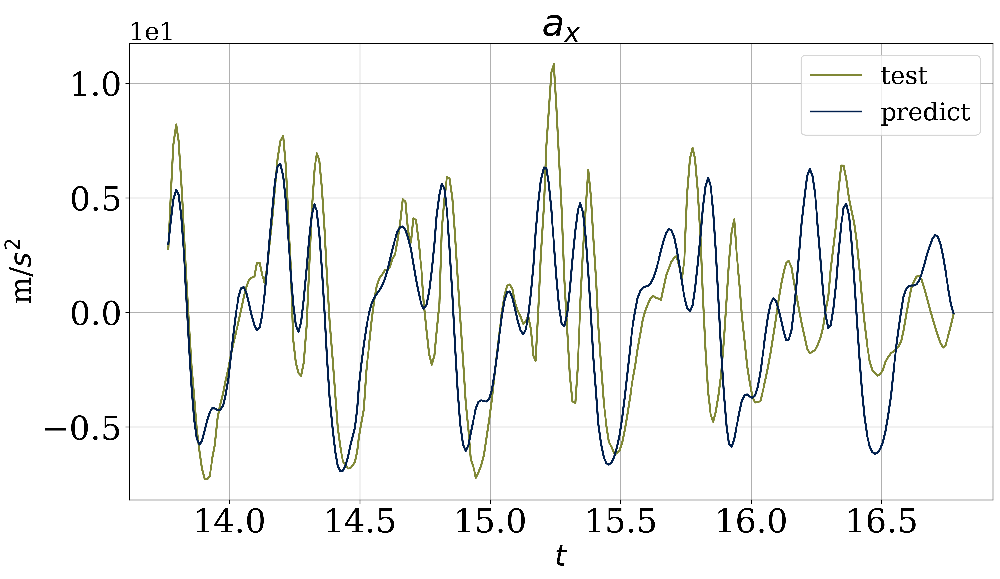

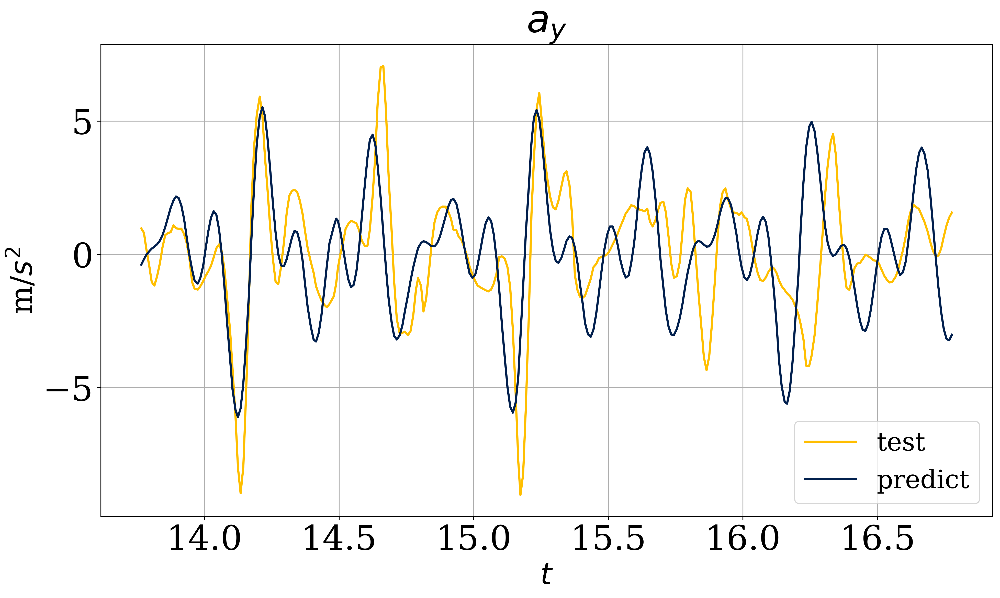

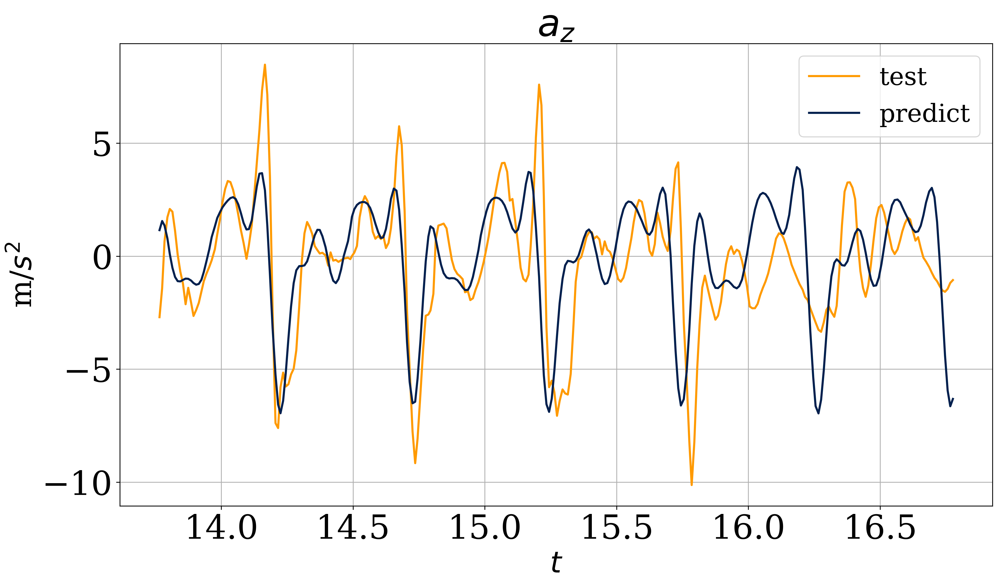

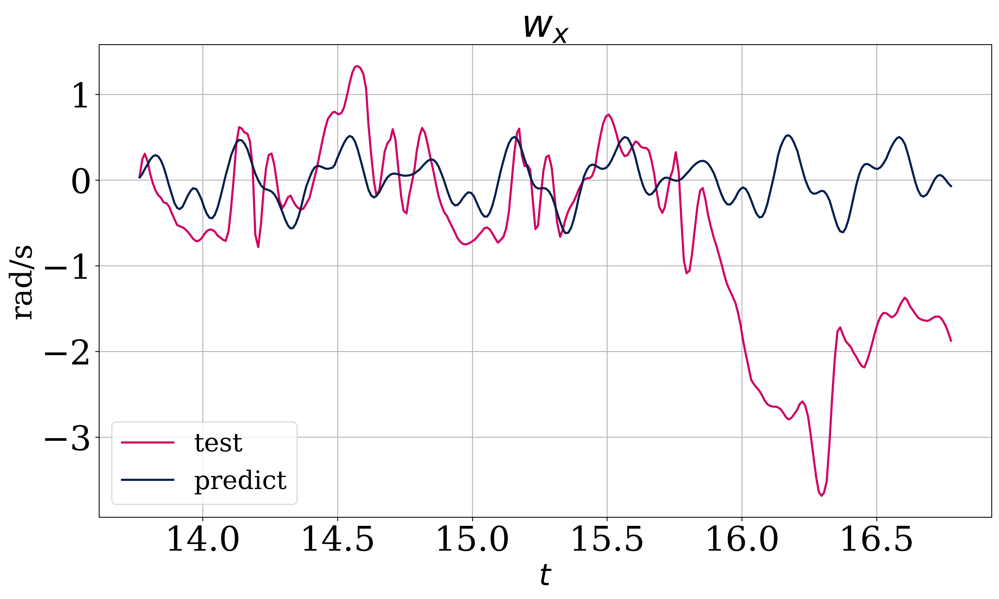

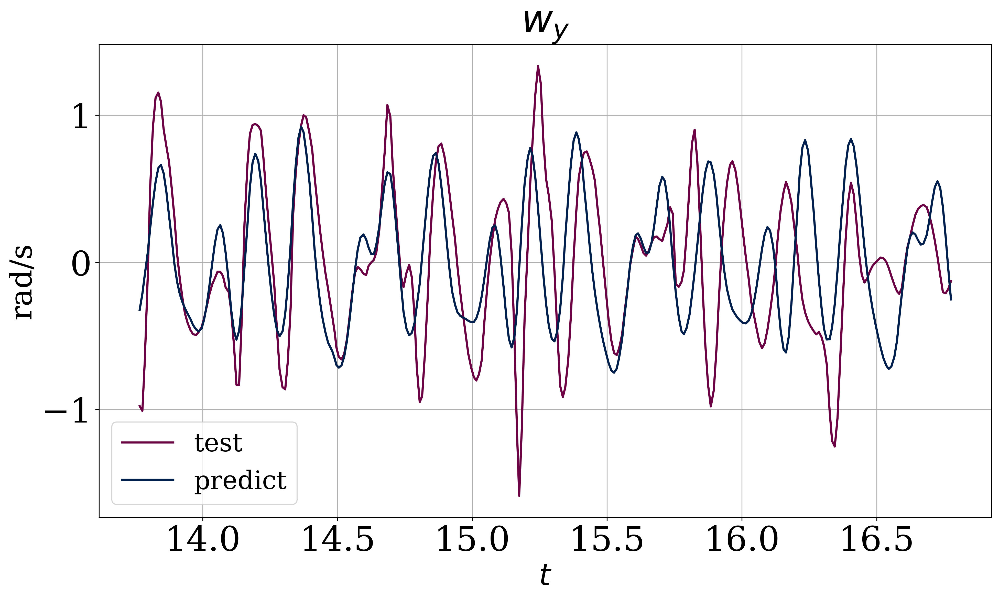

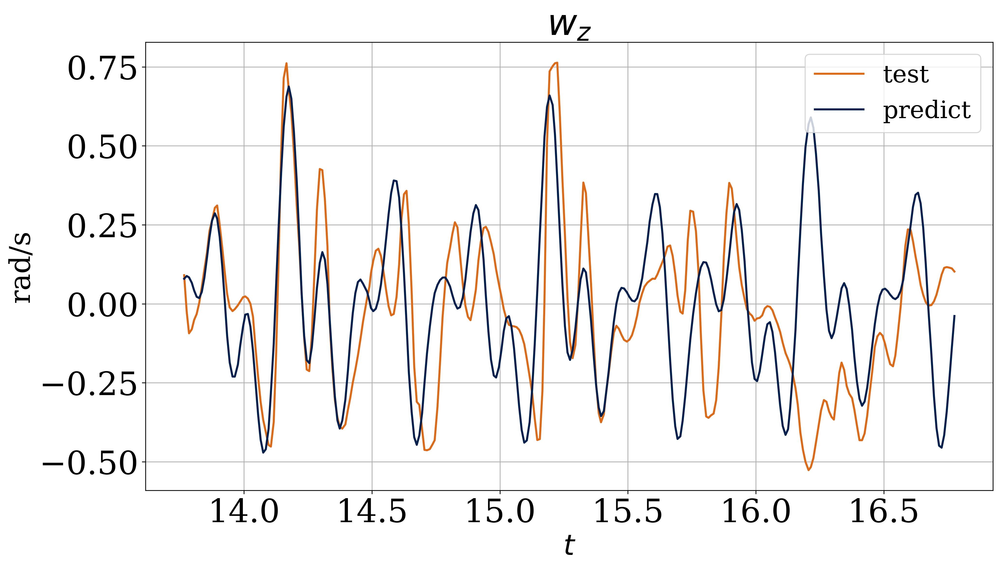

In [20]:
# make directory for figures
pathlib.Path(f'./figs/prediction/cpd_rank_20').mkdir(parents=True, exist_ok=True)

with open(f'./saved_model/cpd_rank_20.pkl', 'rb') as f:
        t_ssa_obj = pickle.load(f)

t_ssa_obj.remove_last_predictions()

# get prediction for cuurent number of factors left
forecast_tssa = np.empty(test_data.shape)

for i in range(test_data.shape[0]):
    forecast_tssa[i] = np.array(t_ssa_obj.predict_next())

for i in range(test_data.shape[1]):
    with EnableJournalStylePlotting():
        fig, ax = plt.subplots(figsize=(15, 8))

        ax.plot(time_grid_test, test_data.T[i], color=color_list[i], label='test')
        ax.plot(time_grid_test, forecast_tssa.T[i], color=color_list[-1], label='predict')

        ax.grid(True)
        ax.legend();
        ax.set_ylabel(f'{sig_units[i]}', fontsize=28)
        ax.set_xlabel('$t$', fontsize=28)
        ax.set_title(f'{sig_names[i]}')

        ax.tick_params(axis='x', labelsize=32)
        ax.tick_params(axis='y', labelsize=32)
        if i == 0:
            ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

        fig.savefig(f'./figs/prediction/cpd_rank_20/{sig_names[i].replace(" ", "_")}.png',
                             format='png')

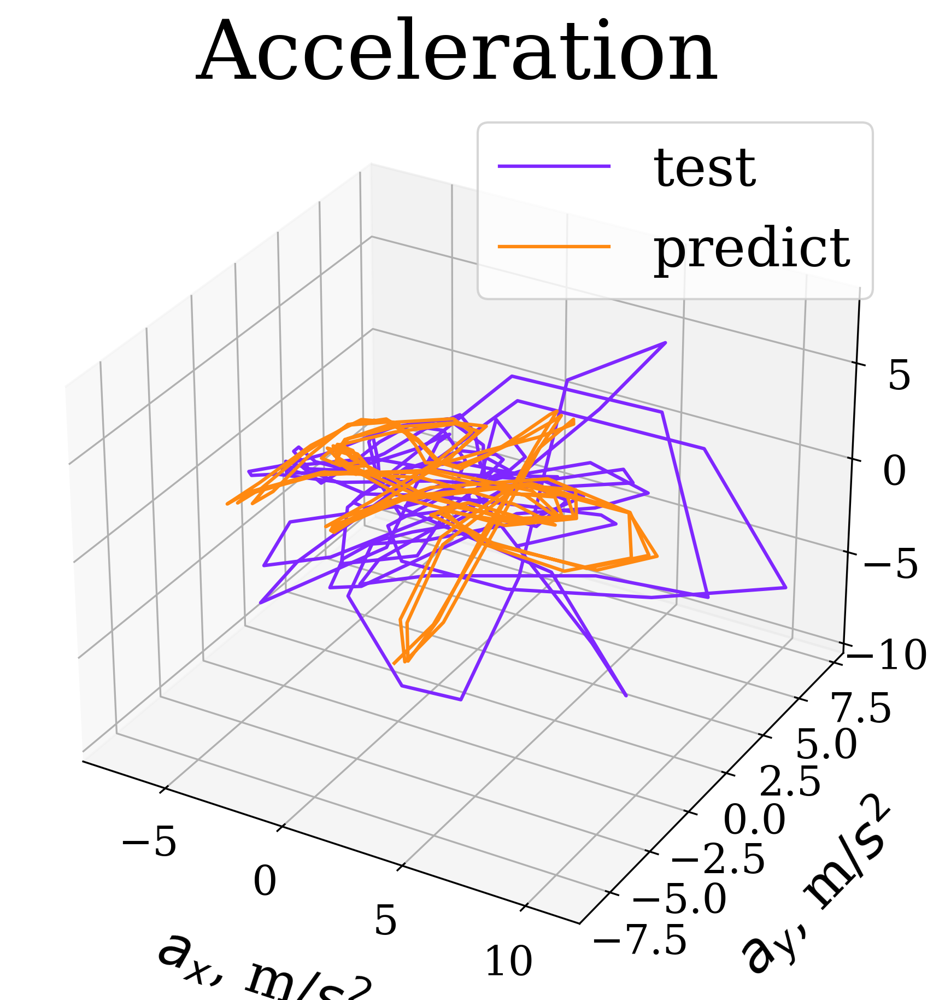

In [23]:
# 3d acceler plots
component_colors = ["#7F27FF", "#FF8911"]

# make directory for figures
pathlib.Path(f'./figs/prediction/cpd_rank_20').mkdir(parents=True, exist_ok=True)

with open(f'./saved_model/cpd_rank_20.pkl', 'rb') as f:
        t_ssa_obj = pickle.load(f)

t_ssa_obj.remove_last_predictions()

# get prediction for cuurent number of factors left
forecast_tssa = np.empty(test_data.shape)

for i in range(test_data.shape[0]):
    forecast_tssa[i] = np.array(t_ssa_obj.predict_next())

with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')

    ax.plot(*(test_data.T[:3, ::2]), color=component_colors[0], label="test", linewidth=1.5)
    ax.plot(*(forecast_tssa.T[:3, ::2]), color=component_colors[1], label="predict", linewidth=1.5)

    ax.set_xlabel(f"{sig_names[0]}, {sig_units[0]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[1]}, {sig_units[1]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[2]}, {sig_units[2]}", labelpad=21)
    ax.set_title(f"Acceleration")
    ax.legend()

    for axis in ["x", "y", "z"]:
        #ax.ticklabel_format(axis=axis, style="scientific", scilimits=(0, 0))
        ax.tick_params(axis=axis, labelsize=18)
    
    fig.savefig(f"./figs/prediction/cpd_rank_20/acceler.png", format='png')

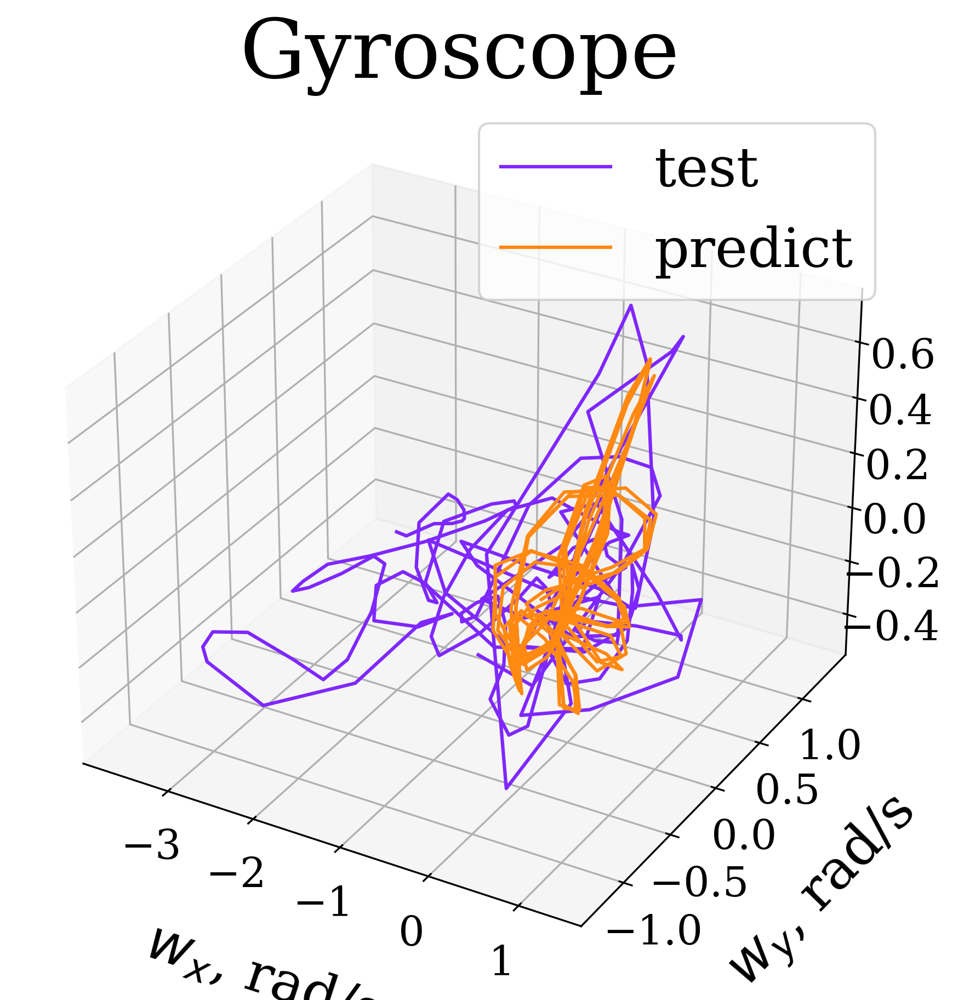

In [24]:
# 3d gyro plots
component_colors = ["#7F27FF", "#FF8911"]

with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')

    ax.plot(*(test_data.T[3:, ::2]), color=component_colors[0], label="test", linewidth=1.5)
    ax.plot(*(forecast_tssa.T[3:, ::2]), color=component_colors[1], label="predict", linewidth=1.5)

    ax.set_xlabel(f"{sig_names[3]}, {sig_units[3]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[4]}, {sig_units[4]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[5]}, {sig_units[5]}", labelpad=21)
    ax.set_title(f"Gyroscope")
    ax.legend()

    for axis in ["x", "y", "z"]:
        #ax.ticklabel_format(axis=axis, style="scientific", scilimits=(0, 0))
        ax.tick_params(axis=axis, labelsize=18)
    
    fig.savefig(f"./figs/prediction/cpd_rank_20/gyro.png", format='png')